# Decision Tree 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import MultipleLocator
from sklearn import tree
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingRegressor, RandomForestRegressor
from mlxtend.evaluate import bias_variance_decomp

## Data Preprocessing

In [2]:
carseats = pd.read_csv('./Carseats.csv')
X = carseats.drop(['Sales'], axis = 1)
X = pd.get_dummies(X)
y = carseats['Sales']
X_train = X.head(300)
y_train = y.head(300)
X_test = X.tail(100)
y_test = y.tail(100)

In [3]:
X_test

,CompPrice,Income,Advertising,Population,Price,Age,Education,ShelveLoc_Bad,ShelveLoc_Good,ShelveLoc_Medium,Urban_No,Urban_Yes,US_No,US_Yes
300,116,78,1,158,99,45,11,0,0,1,0,1,0,1
301,99,93,0,198,87,57,16,0,0,1,0,1,0,1
302,108,77,13,388,110,74,14,1,0,0,0,1,0,1
303,133,52,16,290,99,43,11,0,0,1,0,1,0,1
304,123,98,12,408,134,29,10,0,1,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,138,108,17,203,128,33,14,0,1,0,0,1,0,1
396,139,23,3,37,120,55,11,0,0,1,1,0,0,1
397,162,26,12,368,159,40,18,0,0,1,0,1,0,1
398,100,79,7,284,95,50,12,1,0,0,0,1,0,1


In [4]:
y_test

300     8.57
301     7.41
302     5.28
303    10.01
304    11.93
       ...  
395    12.57
396     6.14
397     7.41
398     5.94
399     9.71
Name: Sales, Length: 100, dtype: float64

## Data Statistics

In [5]:
numerical = carseats.drop(['ShelveLoc','Urban','US'], axis = 1)
categorical = carseats[['ShelveLoc','Urban','US']]

In [6]:
numerical.describe()

,Sales,CompPrice,Income,Advertising,Population,Price,Age,Education
count,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000
mean,7.496325,124.975000,68.657500,6.635000,264.840000,115.795000,53.322500,13.900000
std,2.824115,15.334512,27.986037,6.650364,147.376436,23.676664,16.200297,2.620528
min,0.000000,77.000000,21.000000,0.000000,10.000000,24.000000,25.000000,10.000000
25%,5.390000,115.000000,42.750000,0.000000,139.000000,100.000000,39.750000,12.000000
50%,7.490000,125.000000,69.000000,5.000000,272.000000,117.000000,54.500000,14.000000
75%,9.320000,135.000000,91.000000,12.000000,398.500000,131.000000,66.000000,16.000000
max,16.270000,175.000000,120.000000,29.000000,509.000000,191.000000,80.000000,18.000000


In [7]:
categorical['ShelveLoc'].value_counts()

Medium    219
Bad        96
Good       85
Name: ShelveLoc, dtype: int64

In [8]:
categorical['Urban'].value_counts()

Yes    282
No     118
Name: Urban, dtype: int64

In [9]:
categorical['US'].value_counts()

Yes    258
No     142
Name: US, dtype: int64

Text(0.5, 1.0, 'Income')

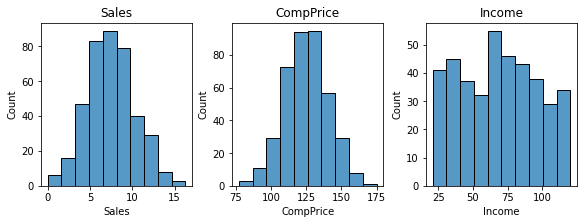

In [10]:
fig, ax =plt.subplots(1,3,constrained_layout=True, figsize=(8, 3))
pic = sns.histplot(carseats, x = "Sales", ax = ax[0], bins = 10)
pic.set_title('Sales')
pic = sns.histplot(carseats, x = "CompPrice", ax = ax[1], bins = 10)
pic.set_title('CompPrice')
pic = sns.histplot(carseats, x = "Income", ax = ax[2], bins = 10)
pic.set_title('Income')

Text(0.5, 1.0, 'Price')

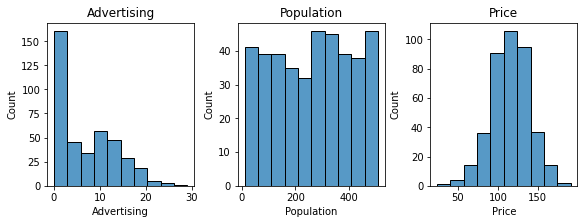

In [11]:
fig, ax =plt.subplots(1,3,constrained_layout=True, figsize=(8, 3))
pic = sns.histplot(carseats, x = "Advertising", ax = ax[0], bins = 10)
pic.set_title('Advertising')
pic = sns.histplot(carseats, x = "Population", ax = ax[1], bins = 10)
pic.set_title('Population')
pic = sns.histplot(carseats, x = "Price", ax = ax[2], bins = 10)
pic.set_title('Price')

Text(0.5, 1.0, 'Education')

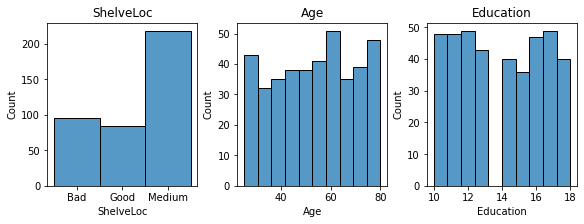

In [12]:
fig, ax =plt.subplots(1,3,constrained_layout=True, figsize=(8, 3))
pic = sns.histplot(carseats, x = "ShelveLoc", ax = ax[0], bins = 10)
pic.set_title('ShelveLoc')
pic = sns.histplot(carseats, x = "Age", ax = ax[1], bins = 10)
pic.set_title('Age')
pic = sns.histplot(carseats, x = "Education", ax = ax[2], bins = 10)
pic.set_title('Education')

Text(0.5, 1.0, 'US')

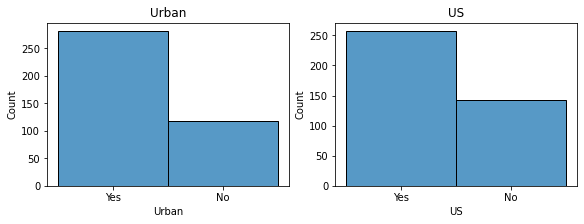

In [13]:
fig, ax =plt.subplots(1,2,constrained_layout=True, figsize=(8, 3))
pic = sns.histplot(carseats, x = "Urban", ax = ax[0], bins = 10)
pic.set_title('Urban')
pic = sns.histplot(carseats, x = "US", ax = ax[1], bins = 10)
pic.set_title('US')

## Decision Tree

In [14]:
params = {'max_depth':[i for i in range(1,11)],'min_samples_leaf':[x for x in range(1,21)]} # Perform GridSearchCV on the decision tree
grid = GridSearchCV(tree.DecisionTreeRegressor(random_state=3020),param_grid = params, cv=5, n_jobs = -1)
grid.fit(X_train,y_train)
print('Best Parameter Pairs: ', grid.best_params_)

Best Parameter Pairs:  {'max_depth': 8, 'min_samples_leaf': 9}


In [15]:
def decision_tree(maxdepth, minleafsamples):
    reg = tree.DecisionTreeRegressor(max_depth = maxdepth, min_samples_leaf = minleafsamples, random_state = 3020)
    reg.fit(X_train, y_train)
    y_train_pred = reg.predict(X_train)
    train_MSE = metrics.mean_squared_error(y_train, y_train_pred)
    y_test_pred = reg.predict(X_test)
    test_MSE = metrics.mean_squared_error(y_test, y_test_pred)
    return train_MSE, test_MSE

In [16]:
diff_depth = pd.DataFrame(columns = ['max depth', 'train_MSE', 'test_MSE'])
for i in range(1,11):
    train_mse, test_mse = decision_tree(i, 9)
    chart = [i, train_mse, test_mse]
    diff_depth.loc[len(diff_depth)] = chart
diff_depth

,max depth,train_MSE,test_MSE
0,1.0,5.920281,6.139168
1,2.0,4.696561,5.365248
2,3.0,3.857952,5.621386
3,4.0,3.160792,5.401050
4,5.0,2.403175,5.061259
5,6.0,2.075821,4.993891
6,7.0,1.949699,5.002960
7,8.0,1.949699,5.002960
8,9.0,1.949699,5.002960
9,10.0,1.949699,5.002960


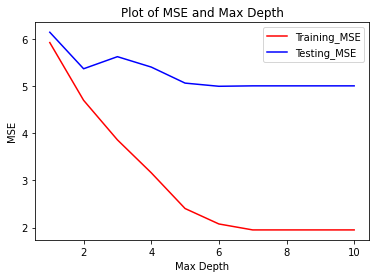

In [17]:
plt.plot(diff_depth['max depth'], diff_depth['train_MSE'], color = 'r', label = 'Training_MSE')
plt.plot(diff_depth['max depth'], diff_depth['test_MSE'], color = 'b', label = 'Testing_MSE')
plt.xlabel('Max Depth')
plt.ylabel('MSE')
plt.title('Plot of MSE and Max Depth')
plt.legend(loc = "best")
plt.show()

In [18]:
diff_leaf_size = pd.DataFrame(columns = ['least node size', 'train_MSE', 'test_MSE'])
for i in range(1,21):
    train_mse, test_mse = decision_tree(8, i)
    chart = [i, train_mse, test_mse]
    diff_leaf_size.loc[len(diff_leaf_size)] = chart
diff_leaf_size

,least node size,train_MSE,test_MSE
0,1.0,0.360929,5.664006
1,2.0,0.482454,5.509982
2,3.0,0.643020,4.917055
3,4.0,0.981181,4.724351
4,5.0,1.127044,4.622102
5,6.0,1.392510,4.850672
6,7.0,1.669620,4.666841
7,8.0,1.892444,4.668379
8,9.0,1.949699,5.002960
9,10.0,2.140345,5.151384


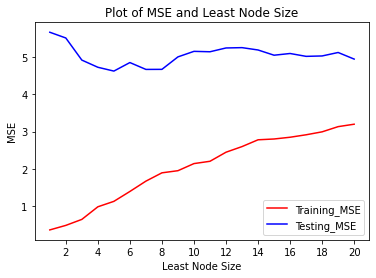

In [19]:
plt.plot(diff_leaf_size['least node size'], diff_leaf_size['train_MSE'], color = 'r', label = 'Training_MSE')
plt.plot(diff_leaf_size['least node size'], diff_leaf_size['test_MSE'], color = 'b', label = 'Testing_MSE')
plt.xlabel('Least Node Size')
plt.ylabel('MSE')
x_major_locator=MultipleLocator(2)
ax=plt.gca()
ax.xaxis.set_major_locator(x_major_locator)
plt.title('Plot of MSE and Least Node Size')
plt.legend(loc = "best")
plt.show()

In [20]:
tree1 = tree.DecisionTreeRegressor(random_state = 3020)
tree1.fit(X_train, y_train)
fig1 = plt.figure(figsize = (25,20), dpi = 600)
fig1 = tree.plot_tree(tree1, feature_names=X.columns)
plt.savefig('p1.png', format = 'png')

In [22]:
tree2 = tree.DecisionTreeRegressor(max_depth = 4, min_samples_leaf = 10, random_state = 3020)
tree2.fit(X_train, y_train)
fig2 = plt.figure(figsize = (25,20), dpi = 600)
fig2 = tree.plot_tree(tree2, feature_names=X.columns)
plt.savefig('p2.png', format = 'png')

In [23]:
tree3 = tree.DecisionTreeRegressor(max_depth = 4, min_samples_leaf = 20, random_state = 3020)
tree3.fit(X_train, y_train)
fig3 = plt.figure(figsize = (25,20), dpi = 600)
fig3 = tree.plot_tree(tree3, feature_names=X.columns)
plt.savefig('p3.png', format = 'png')

In [24]:
tree4 = tree.DecisionTreeRegressor(max_depth = 8, min_samples_leaf = 10, random_state = 3020)
tree4.fit(X_train, y_train)
fig4 = plt.figure(figsize = (25,20), dpi = 600)
fig4 = tree.plot_tree(tree4, feature_names=X.columns)
plt.savefig('p4.png', format = 'png')

In [25]:
tree5 = tree.DecisionTreeRegressor(max_depth = 8, min_samples_leaf = 20, random_state = 3020)
tree5.fit(X_train, y_train)
fig5 = plt.figure(figsize = (25,20), dpi = 600)
fig5 = tree.plot_tree(tree5, feature_names=X.columns)
plt.savefig('p5.png', format = 'png')

## Bagging of Trees

In [26]:
def Bagging(depth, numtrees):
    reg = BaggingRegressor(base_estimator = tree.DecisionTreeRegressor(max_depth = depth, 
        min_samples_leaf = 9, random_state = 3020), n_estimators = numtrees)
    reg.fit(X_train, y_train)
    y_train_pred = reg.predict(X_train)
    train_MSE = metrics.mean_squared_error(y_train, y_train_pred)
    y_test_pred = reg.predict(X_test)
    test_MSE = metrics.mean_squared_error(y_test, y_test_pred)
    return train_MSE, test_MSE

In [27]:
diff_depth = pd.DataFrame(columns = ['max depth', 'train_MSE', 'test_MSE'])
for i in range(1,11):
    train_mse, test_mse = Bagging(i, 50)
    chart = [i, train_mse, test_mse]
    diff_depth.loc[len(diff_depth)] = chart
diff_depth

,max depth,train_MSE,test_MSE
0,1.0,5.680773,5.803454
1,2.0,4.306131,4.664318
2,3.0,3.168948,3.860233
3,4.0,2.505677,3.672954
4,5.0,2.109477,3.357667
5,6.0,1.961572,3.332203
6,7.0,1.909943,3.245318
7,8.0,1.908443,3.247328
8,9.0,1.980474,3.362803
9,10.0,1.926698,3.223595


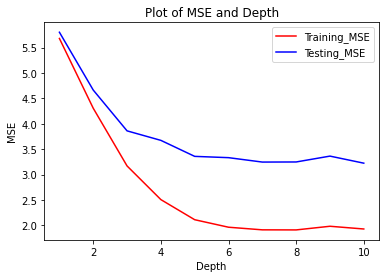

In [28]:
plt.plot(diff_depth['max depth'], diff_depth['train_MSE'], color = 'r', label = 'Training_MSE')
plt.plot(diff_depth['max depth'], diff_depth['test_MSE'], color = 'b', label = 'Testing_MSE')
plt.xlabel('Depth')
plt.ylabel('MSE')
plt.title('Plot of MSE and Depth')
plt.legend(loc = "best")
plt.show()

In [29]:
diff_numtree = pd.DataFrame(columns = ['numtrees', 'train_MSE', 'test_MSE'])
for i in range(1,101):
    train_mse, test_mse = Bagging(6, i)
    chart = [i, train_mse, test_mse]
    diff_numtree.loc[len(diff_numtree)] = chart
diff_numtree

,numtrees,train_MSE,test_MSE
0,1.0,3.157840,5.152144
1,2.0,2.605234,4.148813
2,3.0,2.267341,3.978994
3,4.0,2.308504,3.709493
4,5.0,2.348654,4.203236
...,...,...,...
95,96.0,1.926800,3.282517
96,97.0,1.939560,3.234775
97,98.0,1.922453,3.270397
98,99.0,1.935057,3.240331


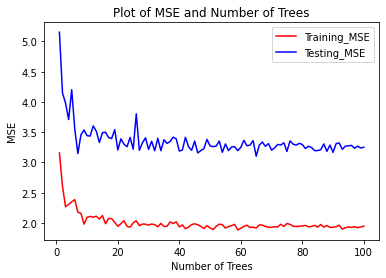

In [30]:
plt.plot(diff_numtree['numtrees'], diff_numtree['train_MSE'], color = 'r', label = 'Training_MSE')
plt.plot(diff_numtree['numtrees'], diff_numtree['test_MSE'], color = 'b', label = 'Testing_MSE')
plt.xlabel('Number of Trees')
plt.ylabel('MSE')
plt.title('Plot of MSE and Number of Trees')
plt.legend(loc = "best")
plt.show()

## Random Forests

In [31]:
params = {'n_estimators' : [10,15,20,30], # Perform GridSearchCV on Random Forests
    'max_depth' : [i for i in range(1,11)],
    'max_features': [i for i in range(3,8)],
    'min_samples_leaf': [i for i in range(5,9)]}
grid = GridSearchCV(RandomForestRegressor(random_state=3020), params, cv = 5, n_jobs = -1)
grid.fit(X_train,y_train)
print('Best Parameter Pairs: ', grid.best_params_)

Best Parameter Pairs:  {'max_depth': 7, 'max_features': 7, 'min_samples_leaf': 5, 'n_estimators': 20}


In [32]:
def random_forests(numtrees, m):
    reg = RandomForestRegressor(n_estimators = numtrees, max_depth = 7, min_samples_leaf = 5, 
                                max_features = m, random_state = 3020)
    reg.fit(X_train, y_train)
    y_train_pred = reg.predict(X_train)
    train_MSE = metrics.mean_squared_error(y_train, y_train_pred)
    y_test_pred = reg.predict(X_test)
    test_MSE = metrics.mean_squared_error(y_test, y_test_pred)
    return train_MSE, test_MSE

In [33]:
diff_numtree = pd.DataFrame(columns = ['numtrees', 'train_MSE', 'test_MSE'])
for i in range(1,101):
    train_mse, test_mse = random_forests(i, 7)
    chart = [i, train_mse, test_mse]
    diff_numtree.loc[len(diff_numtree)] = chart
diff_numtree

,numtrees,train_MSE,test_MSE
0,1.0,3.249559,4.162071
1,2.0,2.330960,3.569878
2,3.0,2.069293,3.922944
3,4.0,1.942994,3.891379
4,5.0,1.900094,3.725721
...,...,...,...
95,96.0,1.448068,2.895577
96,97.0,1.447527,2.893474
97,98.0,1.444459,2.888628
98,99.0,1.437904,2.885082


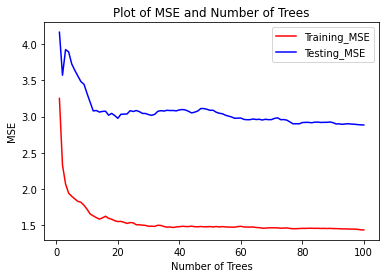

In [34]:
plt.plot(diff_numtree['numtrees'], diff_numtree['train_MSE'], color = 'r', label = 'Training_MSE')
plt.plot(diff_numtree['numtrees'], diff_numtree['test_MSE'], color = 'b', label = 'Testing_MSE')
plt.xlabel('Number of Trees')
plt.ylabel('MSE')
plt.title('Plot of MSE and Number of Trees')
plt.legend(loc = "best")
plt.show()

In [35]:
diff_m = pd.DataFrame(columns = ['m', 'train_MSE', 'test_MSE'])
for i in range(1,11):
    train_mse, test_mse = random_forests(20, i)
    chart = [i, train_mse, test_mse]
    diff_m.loc[len(diff_m)] = chart
diff_m

,m,train_MSE,test_MSE
0,1.0,3.498734,4.708632
1,2.0,2.540802,3.592891
2,3.0,2.082590,3.141609
3,4.0,1.944010,2.978693
4,5.0,1.839393,2.999571
5,6.0,1.660432,3.195636
6,7.0,1.552019,2.975147
7,8.0,1.458330,2.921437
8,9.0,1.435056,3.182927
9,10.0,1.409219,3.141181


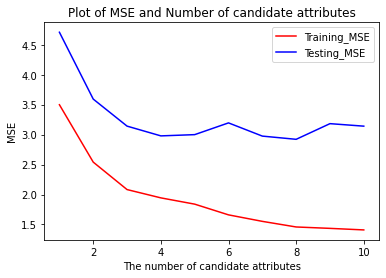

In [36]:
plt.plot(diff_m['m'], diff_m['train_MSE'], color = 'r', label = 'Training_MSE')
plt.plot(diff_m['m'], diff_m['test_MSE'], color = 'b', label = 'Testing_MSE')
plt.xlabel('The number of candidate attributes')
plt.ylabel('MSE')
plt.title('Plot of MSE and Number of candidate attributes')
plt.legend(loc = "best")
plt.show()

## Bias and Variance

In [37]:
X_train = X_train.values
X_test = X_test.values
y_train = y_train.values
y_test = y_test.values
result = pd.DataFrame(columns = ['numtrees','square_bias','variance'])
for numtrees in range(10,101,10):
    reg = RandomForestRegressor(n_estimators = numtrees, max_depth = 7, min_samples_leaf = 5, max_features = 7, n_jobs = -1)
    avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(
            reg, X_train, y_train, X_test, y_test, 
            loss='mse',
            random_seed=3020)
    chart = [numtrees, avg_bias, avg_var]
    result.loc[len(result)] = chart
result

,numtrees,square_bias,variance
0,10.0,2.820218,0.536141
1,20.0,2.831474,0.390439
2,30.0,2.832717,0.339520
3,40.0,2.829133,0.313775
4,50.0,2.832087,0.306308
5,60.0,2.834689,0.291217
6,70.0,2.831386,0.288335
7,80.0,2.826697,0.282101
8,90.0,2.833242,0.276801
9,100.0,2.817910,0.274102


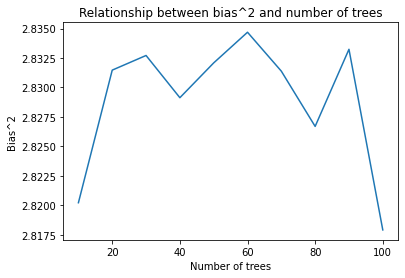

In [38]:
plt.plot(result['numtrees'], result['square_bias'])
plt.title("Relationship between bias^2 and number of trees")
plt.xlabel("Number of trees")
plt.ylabel("Bias^2")
plt.show()

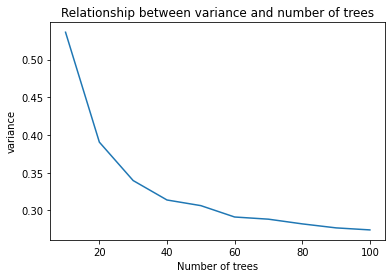

In [39]:
plt.plot(result['numtrees'], result['variance'])
plt.title("Relationship between variance and number of trees")
plt.xlabel("Number of trees")
plt.ylabel("variance")
plt.show()